# FALLBACK PIPELINE

## PIPELINE IMPORTS

In [1]:
%cd /content/
%ls
!pip install --upgrade --no-cache-dir gdown
!git clone https://github.com/ultralytics/yolov5.git  # Cloning the repo 
!gdown 10FTRA1EBIbENR579vdam8CNPA0Zw5PMB                  # Downloading the weights
!gdown --id 1nwgwbSN04Srw6Hq3uarP_mIgrQTv9n5t
!gdown 1DeYVJtVLq9o7zbSFJbD5Z3gDyoH_7dgK
!pip install -r ./yolov5/requirements.txt         # Installing the requirements




### SEGMENTATION IMPORTS

import yolov5.segment.predict as predict
import numpy as np
import os
import cv2
from google.colab.patches import cv2_imshow
import subprocess
import matplotlib.pyplot as plt
import timeit
import time
import torch
%matplotlib inline

#disable yolov5 logging
import logging
logging.getLogger('yolov5').setLevel(logging.WARN)


### DETECTION YOLO IMPORTS
import argparse
import os
import platform
import sys
from pathlib import Path
import torch

from yolov5.models.common import DetectMultiBackend
from yolov5.utils.dataloaders import IMG_FORMATS, VID_FORMATS, LoadImages, LoadScreenshots, LoadStreams
from yolov5.utils.general import (LOGGER, Profile, check_file, check_img_size, check_imshow, check_requirements, colorstr, cv2,
                           increment_path, non_max_suppression, print_args, scale_boxes, strip_optimizer, xyxy2xywh)
from yolov5.utils.plots import Annotator, colors, save_one_box
from yolov5.utils.torch_utils import select_device, smart_inference_mode



### OCR IMPORTS
!git clone https://github.com/PaddlePaddle/PaddleOCR.git
!pip3 install -r ./PaddleOCR/requirements.txt
!pip install paddlepaddle
!pip install Polygon3

from PaddleOCR import PaddleOCR,draw_ocr
ocr = PaddleOCR(use_angle_cls=True, lang='en')

#disable paddleOCR logging
import logging 
logging.getLogger('ppocr').setLevel(logging.WARN)


/content
sample_data/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0
Cloning into 'yolov5'...
remote: Enumerating objects: 15070, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 15070 (delta 25), reused 29 (delta 12), pack-reused 15019
Receiving objects: 100% (15070/15070), 14.07 MiB | 21.22 MiB/s, done.
Resolving deltas: 100% (10324/10324), done.
Downloading...
From: https://drive.google.com/uc?id=10FTRA1EBIbENR579vdam8CNPA0Zw5PMB
To: /content/best.pt
100% 4.04M/4.04M [00:00<00:00, 237MB/s]
/usr/local/lib/python3.8/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: 

100%|██████████| 4.00M/4.00M [00:15<00:00, 261kiB/s]


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv3_rec_infer/en_PP-OCRv3_rec_infer.tar


100%|██████████| 9.96M/9.96M [00:15<00:00, 646kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:13<00:00, 162kiB/s]

[2023/02/07 15:07:40] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='fast', e2e_pgnet_score_thresh=0.5, e2e_pgnet_valid_set

## Monitor segmentation & warping

In [2]:
# Helper functions

def plotim(im_list, title_list):  # To plot a list of images and their titles
  import math
  nrows = math.ceil(len(im_list)/3)
  fig, ax = plt.subplots(nrows, 3, figsize=(nrows*30, 50))
  if nrows==1:
    for i in range(len(im_list)):
      ax[i%3].imshow(im_list[i])
      ax[i%3].set_title(title_list[i], size=22)
  else:
    for i in range(len(im_list)):
      ax[i//3, i%3].imshow(im_list[i])
      ax[i//3, i%3].set_title(title_list[i], size=22)
  plt.show()   


def importimage(filename):#import the image    
  image=cv2.imread(filename)
  # print(widt,heigt)
  return image 

def runInferencenew(filename,input_dir):
  op=predict.run(weights='/content/best.pt',save_txt=True,source=filename,exist_ok=True,nosave=True)
  print(op)
  return op

def getmbox(filename,image,input_dir):     #get all mask boundary points
  file_ext = os.path.splitext(filename)[1]
  basename = str(os.path.basename(filename))
  bbox=list()
  try:
    with open('/content/yolov5/runs/predict-seg/exp/labels/'+ basename.rstrip(file_ext) +'.txt') as f:
      fl=0
      t=[]
      for x in next(f).split():       #reading file
        if fl==0:
          fl+=1
          continue
        if fl%2==0:
          t.append(float(x)*image.shape[0])
          bbox.append(t.copy())
        else:
          t.append(float(x)*image.shape[1])
        if(fl%2==0):
          t.clear()
        fl+=1
  except:
     bbox = [[0,0], [0, image.shape[1]], [image.shape[0], 0], [image.shape[0], image.shape[1]]]
  return bbox 

def dis2(c,d):
  return c*c+d*d

def getcorners2(filename,image,mbox):       #opencv corner coordinate function
  nim2=np.zeros((image.shape[0],image.shape[1],image.shape[2]))
  nim=cv2.fillConvexPoly(nim2.copy(),np.array(mbox,np.int32),color=(255,255,255))
  img=nim
  gray = cv2.cvtColor(np.float32(img), cv2.COLOR_BGR2GRAY)
  blurred = cv2.bilateralFilter(gray, 9, 75, 75)                          #smoothes out the noise in the image
  _, thresh = cv2.threshold(np.uint8(blurred), 0, 255, cv2.THRESH_OTSU)   #automatic image thresholding

  contours, _ = cv2.findContours(np.uint8(blurred), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  contour = contours[0]

  perimeter = cv2.arcLength(contour, True)
  approx = cv2.approxPolyDP(contour, 0.05 * perimeter, True)

  dmin=10000000000
  ireq=-1
  for i in range(4):
    if dis2(approx[i][0][0],approx[i][0][1])<dmin:
      ireq=i
      dmin=dis2(approx[i][0][0],approx[i][0][1])
  return [approx[ireq][0],approx[(ireq-1+4)%4][0],approx[(ireq-2+4)%4][0],approx[(ireq-3+4)%4][0]]

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def warpimage(image,corners):        #apply warping to the image
  cornersp = np.float32([corners[0], corners[1], corners[2], corners[3]])
  width, height = image.shape[1],image.shape[0]
  pts2 = np.float32([[0,0],[width,0],[width,height],[0,height]])
  matrix = cv2.getPerspectiveTransform(cornersp,pts2)
  output = cv2.warpPerspective(image,matrix,(width,height))
  return output

def runsegmentation(filenames,input_dir):      #aggregate function - pass file name as input relative to /content/quickbrownfoxx/
    #note that first run is not saved as exp1 - so think accordingly
  t=0
  outputArray = []
  for filename in filenames:
    # try:
      # t_simp=time.time()
      image = importimage(filename)
      # t_eimp=time.time()
      # print('import time :',t_eimp-t_simp)
      # t_sinf=time.time()
      timetaken=runInferencenew(filename,input_dir)
      # print("real inference time :",timetaken)
      # t_einf=time.time()
      # print('inference time :',t_einf-t_sinf)
      # t_smbox=time.time()
      mbox=getmbox(filename,image,input_dir)
      # t_embox=time.time();
      # print('mbox time :',t_embox-t_smbox)

      seg_img = cv2.polylines(image.copy(),np.array([mbox],np.int32),isClosed=True,color=(255,255,0),thickness=3)
      
      # bbox=getbbox(filename,image,i)
      # coords=getcorners(bbox,mbox)
      # t_sco=time.time()
      coords=getcorners2(filename,image,mbox)  #openCV corner function
      # t_eco=time.time()
      # print('getcorners2 time :',t_eco-t_sco)
      # print(coords)
      # t_sw=time.time()
      final=warpimage(image,coords)
      # t_ew=time.time()
      # print('warp time :',t_ew-t_sw)
      # cv2_imshow(final)
      plotim([image,seg_img, final], ['Original img', 'After Segmentation', 'After Segmentation + Warping'])
      # cv2_imshow(final)
      cv2.imwrite('/content/'+  (filename.split('.')[0]).split('/')[-1] + 'sw.jpg'   ,final)
      # t_spl=time.time()
      # t_epl=time.time()
      # print('plotting time :',t_epl-t_spl)
      outputArray.append((final, seg_img))
  return outputArray
    # except Exception:
      # t+=1
  # print('Failed on ', t, 'tests')
                       #pipeline output

## Image Processing

## Image processing techniques

We are using the technique of Image Erosion to remove glare from our images and clear out the text for easy detection by the OCR. This also removes the background from the monitor screen.

We basically subtract the eroded image from the source image. As erosion removes pixels on the boundary of objects, subtracting the eroded image from the source leaves us with an image having only the object boundaries. It removes all the glare from the image.



### Image processing functions


In [3]:
def erodeImage(src):
  kernel = np.ones((5, 5), np.uint8) 
  erode = cv2.erode(src, kernel, iterations = 3)
  filtered = src-erode
  return filtered

# The main image processing function - Inputs a list of images
def run_image_processing(images):
  output=[]
  for image in images:
    processed_image=erodeImage(image)
    plotim([image,processed_image, processed_image],['segmented image','processed image', 'processed image'])
    output.append(processed_image)
  return output

## YOLOv5 Detection Code

In [4]:
def detect(
        detectionModel, 
        source='data/images',  # file/dir/URL/glob/screen/0(webcam)
        data='data/coco128.yaml',  # dataset.yaml path
        imgsz=(640, 640),  # inference size (height, width)
        conf_thres=0.25,  # confidence threshold
        iou_thres=0.45,  # NMS IOU threshold
        max_det=1000,  # maximum detections per image
        view_img=False,  # show results
        save_txt=False,  # save results to *.txt
        save_conf=False,  # save confidences in --save-txt labels
        save_crop=False,  # save cropped prediction boxes
        nosave=True,  # do not save images/videos
        classes=None,  # filter by class: --class 0, or --class 0 2 3
        agnostic_nms=False,  # class-agnostic NMS
        augment=False,  # augmented inference
        visualize=False,  # visualize features
        update=False,  # update all models
        project='runs/detect',  # save results to project/name
        name='exp',  # save results to project/name
        exist_ok=False,  # existing project/name ok, do not increment
        line_thickness=3,  # bounding box thickness (pixels)
        hide_labels=False,  # hide labels
        hide_conf=False,  # hide confidences
        half=False,  # use FP16 half-precision inference
        dnn=False,  # use OpenCV DNN for ONNX inference
        vid_stride=1,  # video frame-rate stride
        printResult=True

):
    source = str(source)
    save_img = not nosave and not source.endswith('.txt')  # save inference images
    is_file = Path(source).suffix[1:] in (IMG_FORMATS + VID_FORMATS)
    is_url = source.lower().startswith(('rtsp://', 'rtmp://', 'http://', 'https://'))
    webcam = source.isnumeric() or source.endswith('.streams') or (is_url and not is_file)
    screenshot = source.lower().startswith('screen')
    if is_url and is_file:
        source = check_file(source)  # download

    # Directories
    save_dir = increment_path(Path(project) / name, exist_ok=exist_ok)  # increment run
    (save_dir / 'labels' if save_txt else save_dir).mkdir(parents=True, exist_ok=True)  # make dir

    # Load model
    model = detectionModel
    stride, names, pt = model.stride, model.names, model.pt
    imgsz = check_img_size(imgsz, s=stride)  # check image size
    resultFound = dict()
    # Dataloader
    bs = 1  # batch_size
    if webcam:
        view_img = check_imshow(warn=True)
        dataset = LoadStreams(source, img_size=imgsz, stride=stride, auto=pt, vid_stride=vid_stride)
        bs = len(dataset)
    elif screenshot:
        dataset = LoadScreenshots(source, img_size=imgsz, stride=stride, auto=pt)
    else:
        dataset = LoadImages(source, img_size=imgsz, stride=stride, auto=pt, vid_stride=vid_stride)
    vid_path, vid_writer = [None] * bs, [None] * bs

    # Run inference
    model.warmup(imgsz=(1 if pt or model.triton else bs, 3, *imgsz))  # warmup
    seen, windows, dt = 0, [], (Profile(), Profile(), Profile())
    for path, im, im0s, vid_cap, s in dataset:
        with dt[0]:
            im = torch.from_numpy(im).to(model.device)
            im = im.half() if model.fp16 else im.float()  # uint8 to fp16/32
            im /= 255  # 0 - 255 to 0.0 - 1.0
            if len(im.shape) == 3:
                im = im[None]  # expand for batch dim

        # Inference
        with dt[1]:
            visualize = increment_path(save_dir / Path(path).stem, mkdir=True) if visualize else False
            pred = model(im, augment=augment, visualize=visualize)

        # NMS
        with dt[2]:
            pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det)

        # Second-stage classifier (optional)
        # pred = utils.general.apply_classifier(pred, classifier_model, im, im0s)

        # Process predictions
        for i, det in enumerate(pred):  # per image
            seen += 1
            if webcam:  # batch_size >= 1
                p, im0, frame = path[i], im0s[i].copy(), dataset.count
                s += f'{i}: '
            else:
                p, im0, frame = path, im0s.copy(), getattr(dataset, 'frame', 0)

            p = Path(p)  # to Path
            save_path = str(save_dir / p.name)  # im.jpg
            txt_path = str(save_dir / 'labels' / p.stem) + ('' if dataset.mode == 'image' else f'_{frame}')  # im.txt
            s += '%gx%g ' % im.shape[2:]  # print string
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  # normalization gain whwh
            imc = im0.copy() if save_crop else im0  # for save_crop
            annotator = Annotator(im0, line_width=line_thickness, example=str(names))
            if len(det):
                # Rescale boxes from img_size to im0 size
                det[:, :4] = scale_boxes(im.shape[2:], det[:, :4], im0.shape).round()

                # Print results
                for c in det[:, 5].unique():
                    n = (det[:, 5] == c).sum()  # detections per class
                    s += f"{n} {names[int(c)]}{'s' * (n > 1)}, "  # add to string

                # Write results
                for *xyxy, conf, cls in reversed(det):
                    if printResult:
                        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                        # print(xywh)
                        if(int(cls) not in resultFound.keys()):
                          resultFound[int(cls)]=[]
                          resultFound[int(cls)].append([xywh, float(conf)])
                        else:
                          resultFound[int(cls)].append([xywh, float(conf)])
                    if save_txt:  # Write to file
                        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                        line = (cls, *xywh, conf) if save_conf else (cls, *xywh)  # label format
                        with open(f'{txt_path}.txt', 'a') as f:
                            f.write(('%g ' * len(line)).rstrip() % line + '\n')

                    if save_img or save_crop or view_img:  # Add bbox to image
                        c = int(cls)  # integer class
                        label = None if hide_labels else (names[c] if hide_conf else f'{names[c]} {conf:.2f}')
                        annotator.box_label(xyxy, label, color=colors(c, True))
                    if save_crop:
                        save_one_box(xyxy, imc, file=save_dir / 'crops' / names[c] / f'{p.stem}.jpg', BGR=True)

            # Stream results
            im0 = annotator.result()
            if view_img:
                if platform.system() == 'Linux' and p not in windows:
                    windows.append(p)
                    cv2.namedWindow(str(p), cv2.WINDOW_NORMAL | cv2.WINDOW_KEEPRATIO)  # allow window resize (Linux)
                    cv2.resizeWindow(str(p), im0.shape[1], im0.shape[0])
                cv2.imshow(str(p), im0)
                cv2.waitKey(1)  # 1 millisecond

            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'image':
                    cv2.imwrite(save_path, im0)
                else:  # 'video' or 'stream'
                    if vid_path[i] != save_path:  # new video
                        vid_path[i] = save_path
                        if isinstance(vid_writer[i], cv2.VideoWriter):
                            vid_writer[i].release()  # release previous video writer
                        if vid_cap:  # video
                            fps = vid_cap.get(cv2.CAP_PROP_FPS)
                            w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
                            h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
                        else:  # stream
                            fps, w, h = 30, im0.shape[1], im0.shape[0]
                        save_path = str(Path(save_path).with_suffix('.mp4'))  # force *.mp4 suffix on results videos
                        vid_writer[i] = cv2.VideoWriter(save_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (w, h))
                    vid_writer[i].write(im0)

        # Print time (inference-only)
        LOGGER.info(f"{s}{'' if len(det) else '(no detections), '}{dt[1].dt * 1E3:.1f}ms")

    # Print results
    t = tuple(x.t / seen * 1E3 for x in dt)  # speeds per image
    LOGGER.info(f'Speed: %.1fms pre-process, %.1fms inference, %.1fms NMS per image at shape {(1, 3, *imgsz)}' % t)
    if save_txt or save_img:
        s = f"\n{len(list(save_dir.glob('labels/*.txt')))} labels saved to {save_dir / 'labels'}" if save_txt else ''
        LOGGER.info(f"Results saved to {colorstr('bold', save_dir)}{s}")
    if update:
        strip_optimizer(weights[0])  # update model (to fix SourceChangeWarning)
    return resultFound

    
def get_bboxes(source_img,source_img_path, detectionModel):
  bboxes=detect(detectionModel=detectionModel, conf_thres=0.45,source=source_img_path, nosave=True, save_txt=False)
  return bboxes

def loadModel(weightsPath = 'yolov5s.pt', device = '', dnn = False, data = 'data/coco128.yaml', half = False):     # Function used to load the model
  device = select_device(device)
  model = DetectMultiBackend(weights= weightsPath, device=device, dnn=dnn, data=data, fp16=half)
  return model

## OCR Helper Functions


In [5]:
def OCR(bounding_box, img):       #OCR function takes the bounding box of the image and the image object, crops the image and returns OCR result on it
  result=[]
  xA = bounding_box[0]
  xB = bounding_box[1]
  yA = bounding_box[2]
  yB = bounding_box[3]
  crop_img=img[yA:yB, xA:xB]
  bordersize = 20
  paddedCrop = cv2.copyMakeBorder(
    crop_img,
    top=bordersize,
    bottom=bordersize,
    left=bordersize,
    right=bordersize,
    borderType=cv2.BORDER_CONSTANT,
    value=[0,0,0]
  )
  # cv2_imshow(paddedCrop)
  result = ocr.ocr(paddedCrop.copy(), cls=True)
  return (result,crop_img)

def getVitalName(a):     # Maps YOLO output with vital name
    if a == 0:
        return 'HR'
    elif a == 1:
        return 'SBP'
    elif a == 2:
        return 'DBP'
    elif a == 3:
        return 'MAP'
    elif a == 4:
        return 'SPO2'
    elif a == 5:
        return 'RR'
    elif a == 6:
        return 'HR_W'
    elif a == 7:
        return 'RR_W'
    elif a == 8:
        return 'SPO2_W'
    else:
        return 'UNKNOWN'

def getVitalsWithClasses(img, bboxes):    # This function passes the bboxes having the vital class to OCR and the graph class to digitizing function
  retlist = dict()
  finalBBoxes = dict()
  for index in bboxes:
    if index=='unknown':
      classname = 'UNKNOWN'
    else:
      classname = getVitalName(index)
    finalBBoxes[classname]=bboxes[index].copy()
    if(classname in ['SPO2', 'RR', 'MAP', 'SBP', 'DBP','HR']):
      coordis=bboxes[index][0][0]
      (result, cropimg) = OCR(coordis, img)
      if (len(result[0]) > 0):
        # print(classname, result)
        retlist[classname] = result[0][0][1][0]
      else:
        retlist[classname] = 'UNKNOWN BUT CLASS FOUND'
      # cv2_imshow(cropimg)
    elif classname=='HR_W':
      coordis=bboxes[index][0][0]
      cropImg = img[coordis[2]:coordis[3], coordis[0]:coordis[1]]
      # cv2_imshow(cropImg)
      get_dig_graph(cropImg.copy())
  return (retlist, finalBBoxes)

## Graph Digitization Function

In [6]:
def plotSubplot(image,final):
  fig=plt.figure(figsize=(10,7))
  fig.add_subplot(2, 2, 1)
  plt.imshow(image[:,:,[2,1,0]])
  plt.axis('off')
  plt.title("before")
  fig.add_subplot(2, 2, 2)
  plt.imshow(final[:,:,[2,1,0]])
  plt.axis('off')
  plt.title("after")

def digitize(crop_img):
    ## OLD APPROACH  
    # hist = cv2.calcHist([crop_img], [0], None, [256], [0, 256])
    # hist = [val[0] for val in hist]
    # indices = list(range(0, 256))
    # s = [(x,y) for y,x in sorted(zip(hist,indices), reverse=True)]
    # red = crop_img[:,:,0]
    # green = crop_img[:,:,1]
    # blue = crop_img[:,:,2]
    # _, mask_r = cv2.threshold(red, s[1][0], 255, cv2.THRESH_BINARY_INV)
    # _, mask_g = cv2.threshold(green, s[1][0], 255, cv2.THRESH_BINARY_INV)
    # _, mask_b = cv2.threshold(blue, s[1][0], 255, cv2.THRESH_BINARY_INV)
    # masked = np.dstack((red,green,blue))
    # masked = cv2.cvtColor(masked,cv2.COLOR_RGB2GRAY)

    ## NEW ONE
    filtro = cv2.pyrMeanShiftFiltering(crop_img, 20, 40)
    gray = cv2.cvtColor(filtro, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    masked = cv2.bitwise_and(filtro,filtro,mask= thresh)
    thresh2 = 128
    img_binary = cv2.threshold(masked, thresh2, 255, cv2.THRESH_BINARY)[1]
    x_=[]
    y_=[]
    for i in range (0,img_binary.shape[0]):
      result = np.where(img_binary[i] == 255)[0]
      result1=[i]*len(result)
      x_=x_+result1
      y_=y_+result.tolist()
    return x_,y_

def get_dig_graph(cropImg):
  %matplotlib inline
  import matplotlib.pyplot as plt
  x_,y_ = digitize(cropImg.copy())
  plt.gca().invert_yaxis()
  plt.scatter(y_,x_, s=0.1)

## Final BBoxes helper functions

In [7]:
def IOU(boxA, boxB):
  xA = max(boxA[0], boxB[0])
  yA = max(boxA[2], boxB[2])
  xB = min(boxA[1], boxB[1])
  yB = min(boxA[3], boxB[3])
  interArea = (xB - xA) * (yB - yA)
  boxAArea = (boxA[1] - boxA[0]) * (boxA[3] - boxA[2])
  boxBArea = (boxB[1] - boxB[0]) * (boxB[3] - boxB[2])
  iou = interArea / float(boxAArea + boxBArea - interArea)
  return iou

def final_boxes(combined,thresh1,thresh2):
  # for box in combined['unknowns']:
  #   for label in combined:
  #     if(label != 'unknowns'):
  #       if(IOU(box[0],combined[label][0][0])> thresh1):
  #         combined['unknowns'].remove(box)
  #         break
  for label in combined:
    if label != 'unknowns':
      for box in combined[label]:
        for box1 in combined[label]:
          if((box1 is not  box) and (IOU(box[0],box1[0]) > thresh2)  ):
            combined[label].remove(box1)
  return combined


def combined_boxes(bboxes1,bboxes2):
  # overalllabels = ['HR','SPO2','SBP','DBP','MAP','RR','HR_W','RR_W','SPO2_W']
  final_boxes = {}
  final_boxes['unknowns'] = []
  for label in bboxes1.keys():
    if label!='unknown':
      if label not in final_boxes.keys():
        final_boxes[label] = list()
      for box in bboxes1[label]:
        final_boxes[label].append(box)
  for label in bboxes2.keys():
    if label != 'unknown':
      if label not in final_boxes.keys():
        final_boxes[label] = list()
      for box in bboxes2[label]:
        final_boxes[label].append(box)
  for box in bboxes1['unknown']:
    final_boxes['unknowns'].append(box)
  for box in bboxes2['unknown']:
    final_boxes['unknowns'].append(box)
  return final_boxes

## Saves the maximum confidence box in the bboxes array with labels and moves the other boxes in the same label to unknown category
def get_single(bboxes):    
  unknown ={"HR": [], "SPO2":[], "SBP":[], "DBP":[], "MAP":[], "RR": []}
  for label in bboxes:
    if label != 'unknown':
      maxconfbox = bboxes[label][0]
      for box in bboxes[label]:
        if(box[1] > maxconfbox[1]):
          maxconfbox = box
      for box in bboxes[label]:
        if (box != maxconfbox):
         unknown[label].append(box)  
      bboxes[label] = [maxconfbox]
    labels = ['HR', 'SPO2', 'SBP', 'DBP', 'MAP', 'RR']
    for label in labels:
      if label not in bboxes.keys():
        bboxes[label] = []
    return bboxes, unknown


def get_final_boxes(dict1,dict2):
  bboxes1 = get_single(dict1.copy())
  bboxes2 = get_single(dict2.copy())
  comb = combined_boxes(bboxes1.copy(),bboxes2.copy())
  final = final_boxes(comb.copy(), 0.5, 0.7)
  return final


def getCoordinateBBox(box, height, width):
  coordinates=[]
  xCenter=int(box[0][0]*width)
  yCenter=int(box[0][1]*height)
  width=int(box[0][2]*width)
  height=int(box[0][3]*height)
  startX=int(xCenter - width/2)
  endX=int(xCenter + width/2)
  startY=int(yCenter - height/2)
  endY=int(yCenter + height/2)
  coordinates.append(startX)
  coordinates.append(endX)
  coordinates.append(startY)
  coordinates.append(endY)
  appender = [coordinates, box[1]]
  return appender

In [8]:
def vitalsValueChecker(vitalsList, labels):
  for label in labels:

    if label == 'SBP':
      if len(vitalsList['SBP'].split('/')) > 1:
        vitalsList['SBP'] = vitalsList['SBP'].split('/')[0]
    if label == 'DBP':
      if len(vitalsList['DBP'].split('/')) > 1:
        vitalsList['DBP'] = vitalsList['DBP'].split('/')[1]
    if label == 'MAP':
      if len(vitalsList['MAP'].split(')')) > 1:
        vitalsList['MAP'] = (vitalsList['MAP'].split(')'))[0]
      if len(vitalsList['MAP'].split('(')) > 1:
        vitalsList['MAP'] = (vitalsList['MAP'].split('('))[-1]

    if vitalsList[label].isnumeric():                       
       vitalsList[label] = int(vitalsList[label])
    else:
       vitalsList[label] = 'NOT FOUND'

    if label == 'SPO2' and vitalsList['SPO2'] != 'NOT FOUND':
      if not(vitalsList['SPO2'] > 75 and vitalsList['SPO2'] < 101):
        vitalsList['SPO2'] = 'NOT FOUND'
    if label == 'RR' and vitalsList['RR'] != 'NOT FOUND':
      if vitalsList['RR'] > 60:
        vitalsList['RR'] = 'NOT FOUND'
    if label == 'DBP' and vitalsList['DBP'] != 'NOT FOUND':
      if vitalsList['DBP'] > 100:
        vitalsList['DBP'] = 'NOT FOUND'
        
  return vitalsList

# Running Cells and Testing Functions

In [9]:
unlabelledWeightsPath = "/content/unlabelled.pt"
erodedWeightsPath = "/content/eroded.pt"
erodedModel=loadModel(weightsPath=erodedWeightsPath)
unlabelledModel=loadModel(weightsPath=unlabelledWeightsPath)

YOLOv5 🚀 v7.0-80-gc3c8e71 Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 322 layers, 86227246 parameters, 0 gradients, 203.9 GFLOPs
YOLOv5 🚀 v7.0-80-gc3c8e71 Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 322 layers, 86227246 parameters, 0 gradients, 203.9 GFLOPs


In [10]:
def runInference(inputImages, input_dir):
  images=inputImages.copy()                                 #relative to root directory                                                 #relative to root directory
  segmented_output=[]
  segmented_output = runsegmentation(images.copy(),input_dir)
  finalWarpedImages = []
  for (final, segmented) in segmented_output:
    finalWarpedImages.append(final)

  # Fetching processed images
  erodedImages = run_image_processing(finalWarpedImages)


  erodedImagesPath = list()

  for i in range(len(images)):
    fileSplit = os.path.splitext(images[i])
    erodedImagesPath.append(fileSplit[0] + 'eroded.jpg')
    cv2.imwrite(fileSplit[0] + 'eroded.jpg', erodedImages[i])
    images[i] = fileSplit[0] + 'sw' + '.jpg'


  for i in range(len(erodedImages)):
    # Fetching BBoxes
    bboxesEroded=get_bboxes(detectionModel=erodedModel,source_img=erodedImages[i], source_img_path = erodedImagesPath[i])
    bboxesUnlabelled=get_bboxes(detectionModel=unlabelledModel,source_img=finalWarpedImages[i], source_img_path = images[i])

    # Fetch Image Size
    height, width, channels = erodedImages[i].shape

    # Redefining bounding boxes with coordinates
    bboxesErodedCoordinates={}
    bboxesUnlabelledCoordinates={}
    labels = ['HR', 'SPO2', 'SBP', 'DBP', 'MAP', 'RR']

    # Conversion to Coordinate BBoxes
    for label in bboxesEroded:
      bboxesErodedCoordinates[label] = list()
      for bbox in bboxesEroded[label]:
        bboxesErodedCoordinates[label].append(getCoordinateBBox(bbox, height, width))

    for label in bboxesUnlabelled:
      bboxesUnlabelledCoordinates[label] = list()
      for bbox in bboxesUnlabelled[label]:
        bboxesUnlabelledCoordinates[label].append(getCoordinateBBox(bbox, height, width)) 

    ### TO BE DECIDED      
    # bboxesErodedCoordinates = get_single(bboxesErodedCoordinates)
    # bboxesUnlabelledCoordinates = get_single(bboxesUnlabelledCoordinates)

    # Fetching detected vitals
    vitalsList, finalBBoxes = getVitalsWithClasses(finalWarpedImages[i], bboxesUnlabelledCoordinates)

    for label in labels:
      if label not in vitalsList.keys():
        vitalsList[label] = "NOT FOUND"

    #  OK CHECK TO TEST IF THE VITALS WE HAVE GOT ARE NUMERIC. ELSE  
    vitalsList = vitalsValueChecker(vitalsList.copy(), labels.copy())
    
    retList = dict()
    # NOT FOUND LABELS
    notFoundLabel = list()
    for label in vitalsList:
      if vitalsList[label] == 'NOT FOUND':
        if label in bboxesErodedCoordinates:
          for box in bboxesErodedCoordinates:
            result, crop_img = OCR(box[0], finalWarpedImages[i])  
            if len(result[0]) > 1:
              maxConf = -1
              for res in result[0]:
                if res[1][1] > maxConf:
                  maxConf = res[1][1]
                  retList[label] = res[1][0]


    # retList, _ = getVitalsWithClasses(finalWarpedImages[i], bboxesErodedCoordinates)

    for label in labels:
      if label not in retList.keys():
        retList[label] = "NOT FOUND"
    print(2,retList)
    
    retList = vitalsValueChecker(retList.copy(), labels.copy())

    for label in labels:
      if vitalsList[label] == 'NOT FOUND':
        if retList[label] != 'NOT FOUND':
          vitalsList[label] = retList[label]

    print(3, retList)
    print(2, vitalsList)
    print(vitalsList)
    
    return vitalsList
    #   for label in vitalsList:

In [11]:
def inference(image_path):
  '''
  Function responsible for inference.
  Args: 
    image_path: str, path to image file. eg. "input/aveksha_micu_mon--209_2023_1_17_12_0_34.jpeg"
  Returns:
    result: dict, final output dictionary. eg. {"HR":"80", "SPO2":"98", "RR":"15", "SBP":"126", "DBP":"86"}
  '''
  result = {}

  result = runInference([image_path],os.path.dirname(image_path)+str('/'))
  
  return result

# SOME SAMPLE OUTPUTS

YOLOv5 🚀 v7.0-80-gc3c8e71 Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 165 layers, 1879750 parameters, 0 gradients, 6.7 GFLOPs
image 1/1 /content/adityawarangal_icu_mon--06_2023_1_6_13_15_1.jpeg: 384x640 1 screen, 112.1ms
Speed: 1.3ms pre-process, 112.1ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to yolov5/runs/predict-seg/exp
1 labels saved to yolov5/runs/predict-seg/exp/labels


None


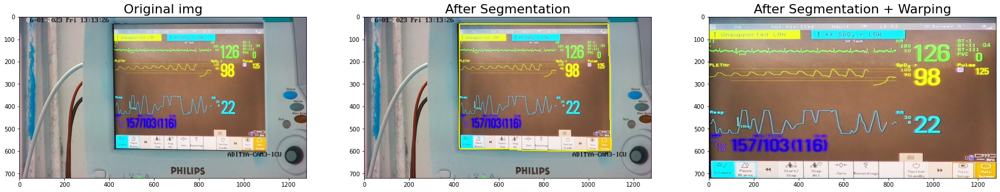

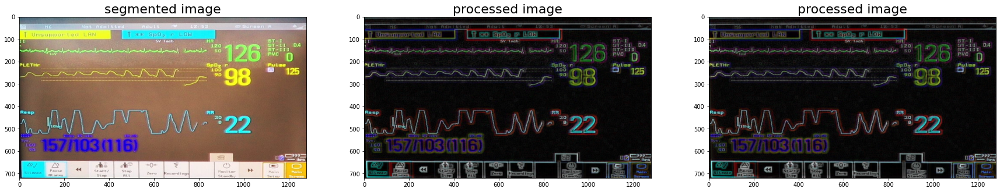

image 1/1 /content/adityawarangal_icu_mon--06_2023_1_6_13_15_1eroded.jpg: 384x640 1 HR, 1 SBP, 1 DBP, 1 SPO2, 1 RR, 1 HR_W, 1 RR_W, 1 SPO2_W, 2208.5ms
Speed: 1.3ms pre-process, 2208.5ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)
image 1/1 /content/adityawarangal_icu_mon--06_2023_1_6_13_15_1sw.jpg: 384x640 1 HR, 1 SBP, 1 DBP, 1 MAP, 1 SPO2, 1 RR, 1 HR_W, 1 RR_W, 1 SPO2_W, 2212.8ms
Speed: 1.1ms pre-process, 2212.8ms inference, 1.3ms NMS per image at shape (1, 3, 640, 640)


2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'RR': 22, 'SBP': 157, 'HR': 120, 'SPO2': 98, 'DBP': 'NOT FOUND', 'MAP': 116}
{'RR': 22, 'SBP': 157, 'HR': 120, 'SPO2': 98, 'DBP': 'NOT FOUND', 'MAP': 116}
{'RR': 22, 'SBP': 157, 'HR': 120, 'SPO2': 98, 'DBP': 'NOT FOUND', 'MAP': 116}


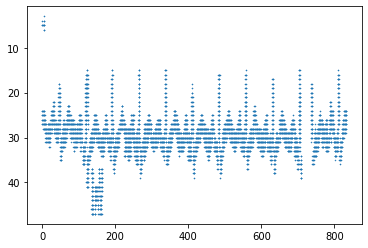

In [14]:
print(inference('/content/adityawarangal_icu_mon--06_2023_1_6_13_15_1.jpeg'))

None


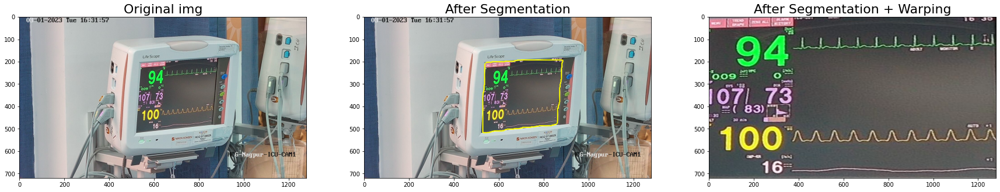

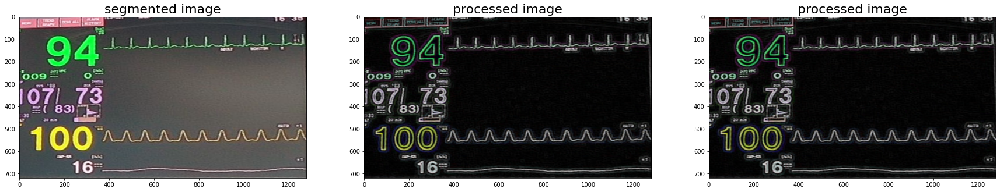

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'MAP': 83, 'RR': 16, 'DBP': 73, 'SBP': 107, 'SPO2': 100, 'HR': 94}
{'MAP': 83, 'RR': 16, 'DBP': 73, 'SBP': 107, 'SPO2': 100, 'HR': 94}


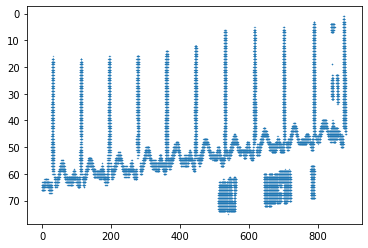

In [ ]:
image = ['/content/test8.jpeg']
input_dir = '/content'
runInference(image.copy(), input_dir)

None


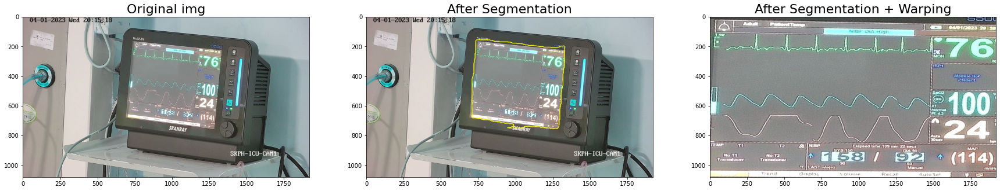

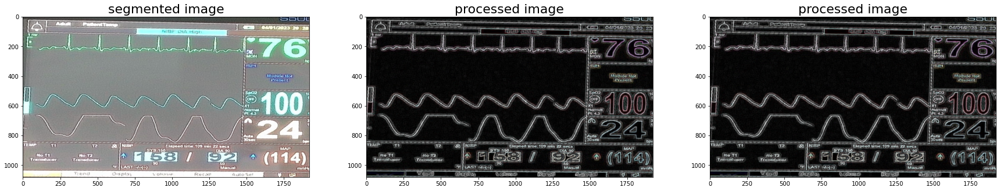

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'DBP': 'NOT FOUND', 'SBP': 158, 'HR': 76, 'MAP': 114, 'SPO2': 100, 'RR': 24}
{'DBP': 'NOT FOUND', 'SBP': 158, 'HR': 76, 'MAP': 114, 'SPO2': 100, 'RR': 24}


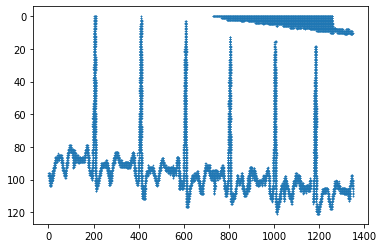

In [ ]:
image = ['/content/test4.jpeg']
input_dir = '/content'
runInference(image, input_dir)

None


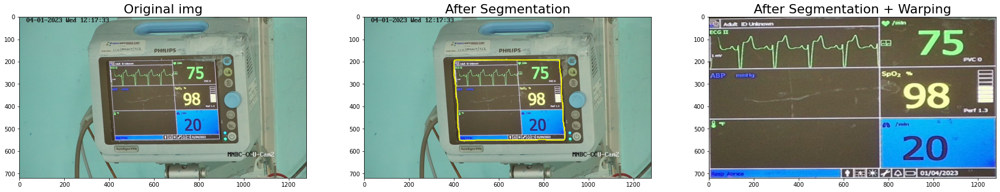

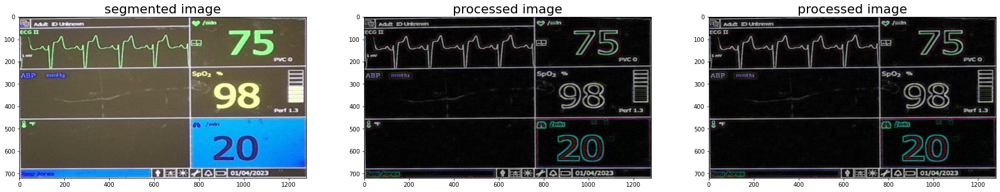

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'RR': 20, 'HR': 75, 'SPO2': 98, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}
{'RR': 20, 'HR': 75, 'SPO2': 98, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}


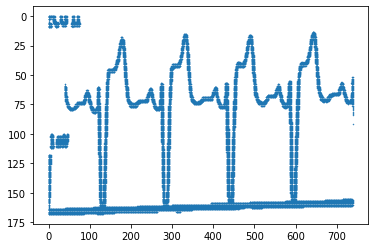

In [ ]:
image = ['/content/test2.jpeg']
input_dir = '/content'
runInference(image, input_dir)

None


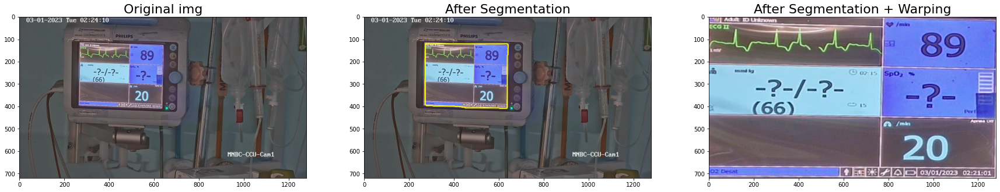

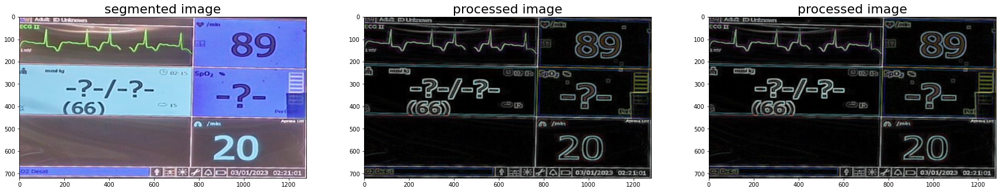

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'RR': 'NOT FOUND', 'MAP': 66, 'HR': 89, 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND'}
{'RR': 'NOT FOUND', 'MAP': 66, 'HR': 89, 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND'}


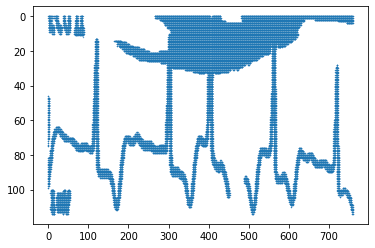

In [ ]:
images = ['/content/test1.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


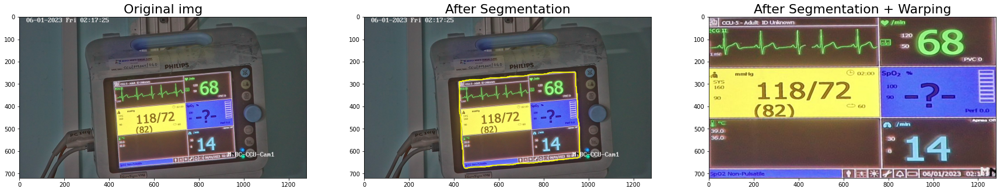

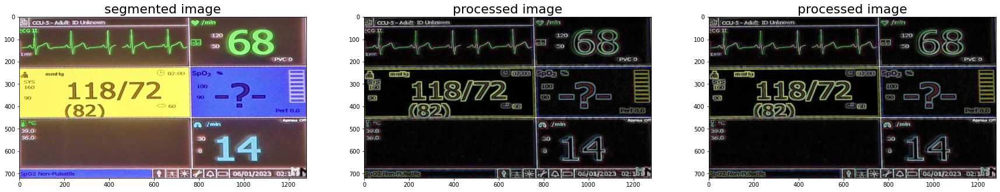

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'RR': 'NOT FOUND', 'HR': 68, 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}
{'RR': 'NOT FOUND', 'HR': 68, 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}


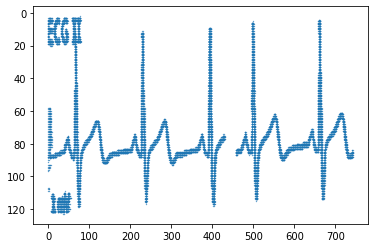

In [ ]:
images = ['/content/test3.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


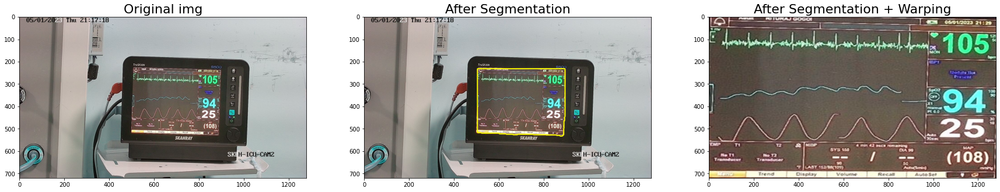

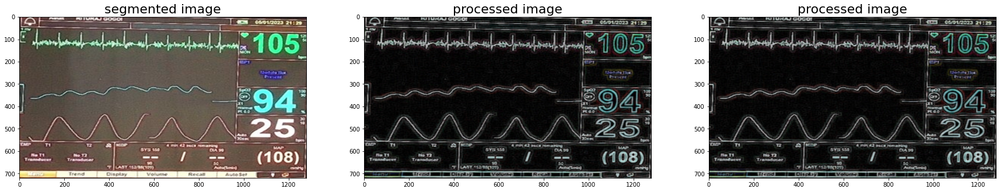

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'RR': 25, 'MAP': 108, 'SPO2': 94, 'HR': 105, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND'}
{'RR': 25, 'MAP': 108, 'SPO2': 94, 'HR': 105, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND'}


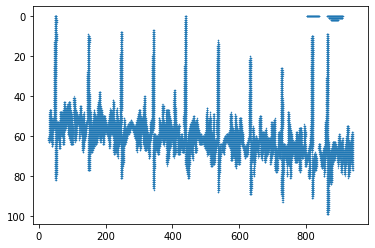

In [ ]:
images = ['/content/test5.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


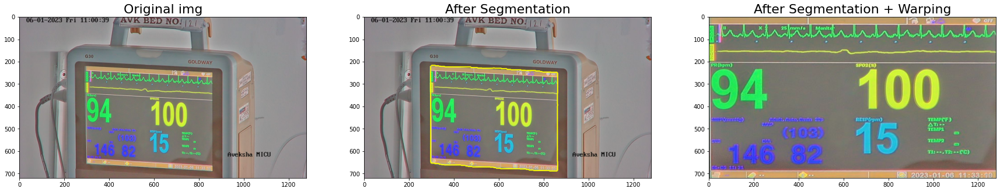

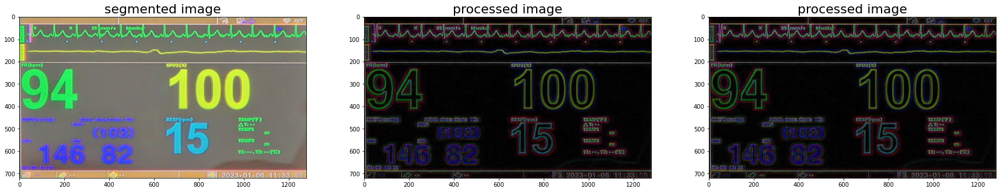

2 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
3 {'HR': 'NOT FOUND', 'SPO2': 'NOT FOUND', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND', 'RR': 'NOT FOUND'}
2 {'MAP': 103, 'SPO2': 100, 'SBP': 146, 'RR': 15, 'DBP': 82, 'HR': 94}
{'MAP': 103, 'SPO2': 100, 'SBP': 146, 'RR': 15, 'DBP': 82, 'HR': 94}


In [ ]:
images = ['/content/test7.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


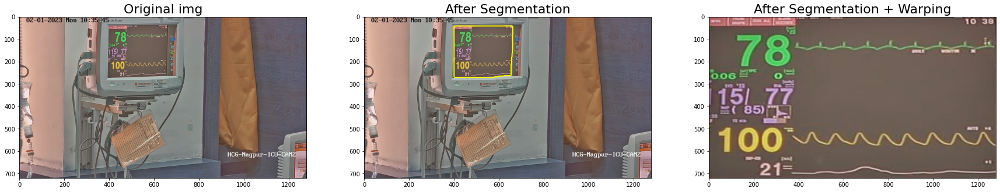

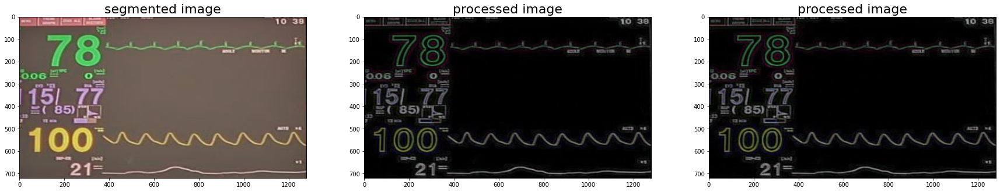

1 {'MAP': 85, 'RR': 21, 'SBP': 15, 'SPO2': 100, 'DBP': 'NOT FOUND', 'HR': 78}
2 {'MAP': '85', 'RR': '21', 'SBP': '15', 'DBP': 'UNKNOWN BUT CLASS FOUND', 'HR': '78', 'SPO2': '100'}
3 {'MAP': 85, 'RR': 21, 'SBP': 15, 'DBP': 'NOT FOUND', 'HR': 78, 'SPO2': 100}
2 {'MAP': 85, 'RR': 21, 'SBP': 15, 'SPO2': 100, 'DBP': 'NOT FOUND', 'HR': 78}


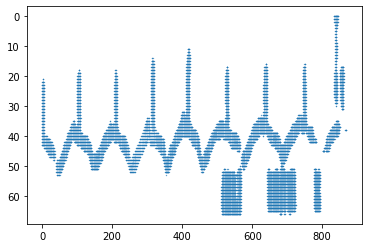

In [ ]:
images = ['/content/test9.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


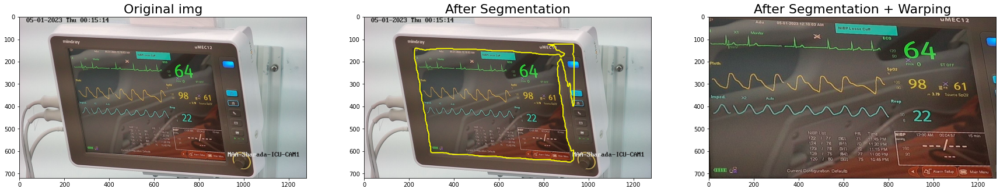

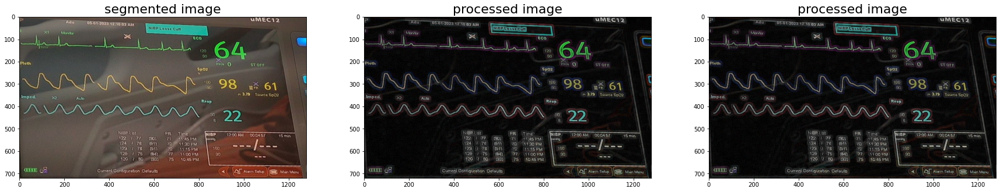

1 {'RR': 'NOT FOUND', 'SPO2': 98, 'HR': 64, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}
2 {'RR': '22', 'SPO2': '98', 'HR': '64', 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}
3 {'RR': 22, 'SPO2': 98, 'HR': 64, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}
2 {'RR': 22, 'SPO2': 98, 'HR': 64, 'SBP': 'NOT FOUND', 'DBP': 'NOT FOUND', 'MAP': 'NOT FOUND'}


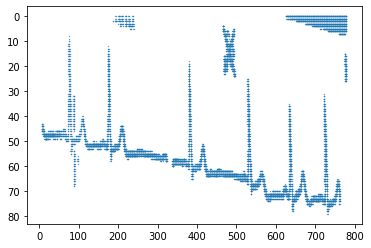

In [ ]:
images = ['/content/test10.jpeg']
input_dir = '/content'
runInference(images, input_dir)

None


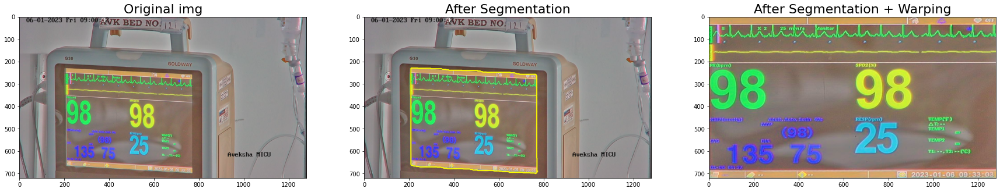

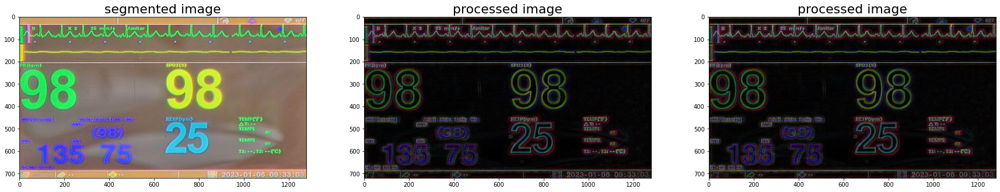

1 {'MAP': 98, 'SBP': 135, 'SPO2': 98, 'RR': 25, 'DBP': 75, 'HR': 98}
2 {'MAP': '98)', 'SPO2': '98', 'SBP': '135', 'DBP': '75', 'RR': '25', 'HR': '98'}
3 {'MAP': 98, 'SPO2': 98, 'SBP': 135, 'DBP': 75, 'RR': 25, 'HR': 98}
2 {'MAP': 98, 'SBP': 135, 'SPO2': 98, 'RR': 25, 'DBP': 75, 'HR': 98}


In [ ]:
images = ['/content/test6.jpeg']
input_dir = '/content'
runInference(images, input_dir)